In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

From https://blog.keras.io/building-autoencoders-in-keras.html

In [2]:
import os.path
from keras.models import load_model

sparsity_save_file="keras_blog_Building_Autoencoder_with_sparsity.h5"
dnn_save_file="keras_blog_Building_Autoencoder_DNN.h5"
cnn_save_file="keras_blog_Building_Autoencoder_CNN.h5"
denoising_save_file="keras_blog_Building_Autoencoder_Denoising_CNN.h5"

Using TensorFlow backend.


## Place most of the imports at a convenient so we can re-start notebook at other than first line

In [3]:
from keras.layers import Input, Dense
from keras.models import Model

from keras.datasets import mnist
import numpy as np

from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

from keras.callbacks import TensorBoard

from keras import callbacks


## Utility to plot results

In [10]:
# use Matplotlib (don't ask)
import matplotlib.pyplot as plt

def show_results(decoded_imgs,  x_test):
    
    n = 10  # how many digits we will display
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # display original
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(x_test[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        
        # display reconstruction
        ax = plt.subplot(2, n, i + 1 + n)

        plt.imshow(decoded_imgs[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        
    plt.show()


In [4]:
from keras.layers import Input, Dense
from keras.models import Model

# this is the size of our encoded representations
encoding_dim = 32  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

# this is our input placeholder
input_img = Input(shape=(784,))
# "encoded" is the encoded representation of the input
encoded = Dense(encoding_dim, activation='relu')(input_img)
# "decoded" is the lossy reconstruction of the input
decoded = Dense(784, activation='sigmoid')(encoded)

# this model maps an input to its reconstruction
autoencoder = Model(input_img, decoded)

In [3]:
# this model maps an input to its encoded representation
encoder = Model(input_img, encoded)

In [4]:
# create a placeholder for an encoded (32-dimensional) input
encoded_input = Input(shape=(encoding_dim,))
# retrieve the last layer of the autoencoder model
decoder_layer = autoencoder.layers[-1]
# create the decoder model
decoder = Model(encoded_input, decoder_layer(encoded_input))

In [5]:
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [6]:
from keras.datasets import mnist
import numpy as np
(x_train, _), (x_test, _) = mnist.load_data()


In [7]:
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print( x_train.shape )
print( x_test.shape )

(60000, 784)
(10000, 784)


In [9]:
autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 4s - loss: 0.1043 - val_loss: 0.1025

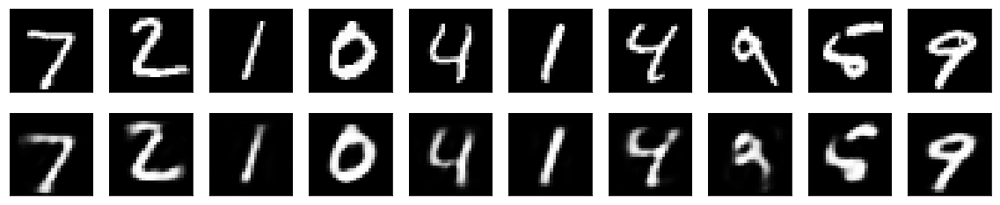

In [22]:
# encode and decode some digits
# note that we take them from the *test* set
encoded_imgs = encoder.predict(x_test)
decoded_imgs = decoder.predict(encoded_imgs)
    
show_results(decoded_imgs, x_test)

# Add a sparsity constraint

In [12]:
from keras import regularizers

encoding_dim = 32

input_img = Input(shape=(784,))
# add a Dense layer with a L1 activity regularizer
encoded = Dense(encoding_dim, activation='relu',
                activity_regularizer=regularizers.l1(10e-5))(input_img)
decoded = Dense(784, activation='sigmoid')(encoded)

autoencoder = Model(input_img, decoded)


In [13]:
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [14]:
autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 5s - loss: 0.6840 - val_loss: 0.6606

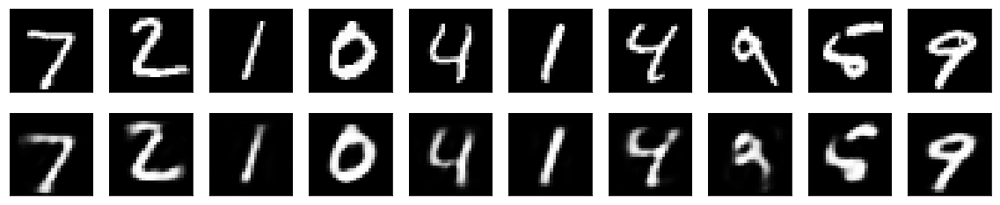

In [23]:
encoded_imgs = encoder.predict(x_test)
decoded_imgs = decoder.predict(encoded_imgs)
    
show_results(decoded_imgs, x_test)


In [17]:
autoencoder.save(sparsity_save_file)

# Deep autoencoder

In [18]:
input_img = Input(shape=(784,))
encoded = Dense(128, activation='relu')(input_img)
encoded = Dense(64, activation='relu')(encoded)
encoded = Dense(32, activation='relu')(encoded)

decoded = Dense(64, activation='relu')(encoded)
decoded = Dense(128, activation='relu')(decoded)
decoded = Dense(784, activation='sigmoid')(decoded)


In [ ]:
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [19]:
autoencoder.fit(x_train, x_train,
                epochs=100,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Train on 60000 samples, validate on 10000 samples
Epoch 1/100
60000/60000 [==============================] - 7s - loss: 0.3649 - val_loss: 0.2640

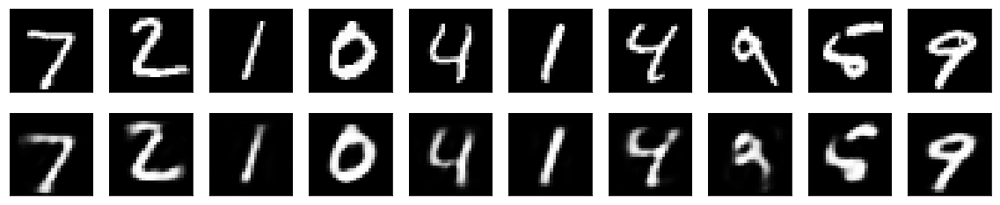

In [24]:
show_results()

In [ ]:
autoencoder.save(dnn_save_file)

# Convolutional autoencoder

In [22]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

In [25]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

## Re-load MNIST data.
### Note: for the NN, we flattened the image from (28x28) to 784.
###  For the CNN, we re-shape it to (28x28x1)

In [15]:
from keras.datasets import mnist
import numpy as np

(x_train, _), (x_test, _) = mnist.load_data()
print("x_train shape original: ", x_train.shape)

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  # adapt this if using `channels_first` image data format

print("x_train shape now: ", x_train.shape)

x_train shape original:  (60000, 28, 28)
x_train shape now:  (60000, 28, 28, 1)


## It took 3 hours to train the CNN. Don't train if we already have a saved model.

In [12]:
from keras.callbacks import TensorBoardfrom keras.callbacks import TensorBoard

if (os.path.isfile(cnn_save_file)):
    print("Restoring CNN from ", cnn_save_file)
    autoencoder = load_model(cnn_save_file)
else:
    autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])
    autoencoder.save(cnn_save_file)

Restoring CNN from  keras_blog_Building_Autoencoder_CNN.h5


Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 80s - loss: 0.6123 - val_loss: 0.2367

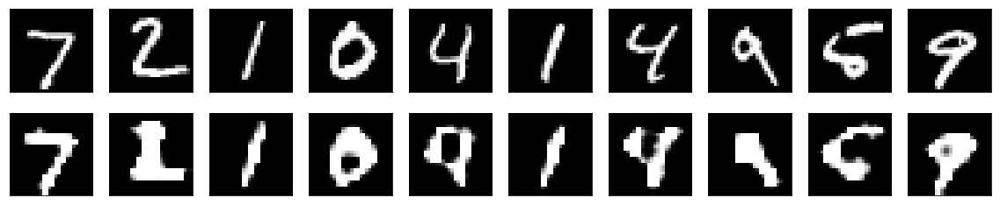

In [16]:
decoded_imgs = autoencoder.predict(x_test)
show_results(decoded_imgs, x_test)

### View the 128-dimensional encoding

In [17]:
# this model maps an input to its encoded representation
encoder = Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)

ValueError: Error when checking : expected input_2 to have 2 dimensions, but got array with shape (10000, 28, 28, 1)

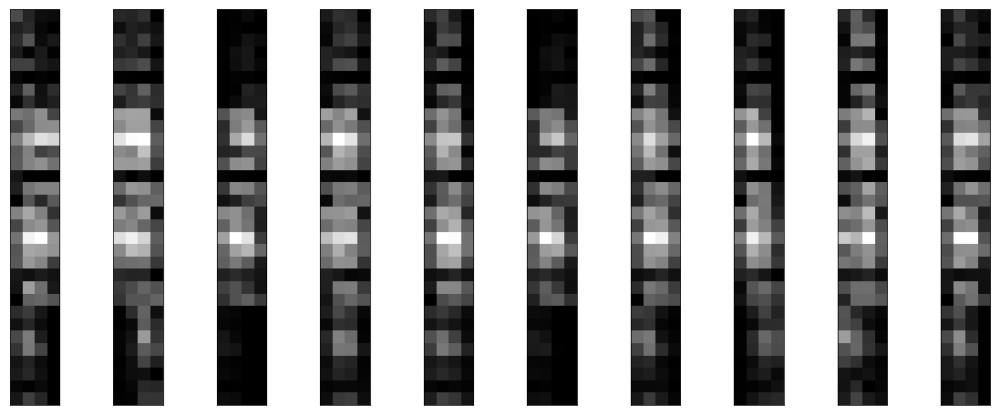

In [39]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(encoded_imgs[i].reshape(4, 4 * 8).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# Image de-noising


In [11]:
from keras.datasets import mnist
import numpy as np

(x_train, _), (x_test, _) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  # adapt this if using `channels_first` image data format

noise_factor = 0.5
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape) 
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape) 

x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

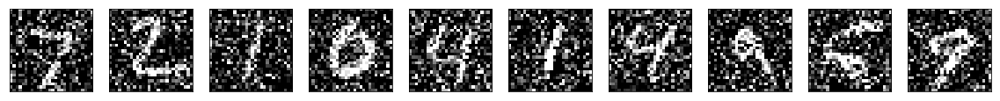

In [19]:
n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()


In [23]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (7, 7, 32)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [29]:
from keras import callbacks

if (os.path.isfile(denoising_save_file)):
    print("Restoring Denoising CNN from ", denoising_save_file)
    autoencoder = load_model(denoising_save_file)
else:
    checkpt_file="denoising_weights.{epoch:02d}-{val_loss:.2f}.hdf5"
    checkpt_cb =callbacks.ModelCheckpoint(checkpt_file, monitor='val_loss', 
                                    verbose=0, save_best_only=False, save_weights_only=False, 
                                    mode='iauto', 
                                    period=5
                                   )
    
    autoencoder.fit(x_train_noisy, x_train,
                epochs=100,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_noisy, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False),
                           checkpt_cb
                          ])
    
    autoencoder.save(denoising_save_file)

Train on 60000 samples, validate on 10000 samples
Epoch 1/100
60000/60000 [==============================] - 201s - loss: 0.1245 - val_loss: 0.1180

KeyboardInterrupt: 

In [8]:

!ls d*

denoising_weights.04-0.14.hdf5	denoising_weights.49-0.16.hdf5
denoising_weights.09-0.13.hdf5	denoising_weights.54-0.14.hdf5
denoising_weights.14-0.17.hdf5	denoising_weights.59-0.15.hdf5
denoising_weights.19-0.12.hdf5	denoising_weights.64-0.17.hdf5
denoising_weights.24-0.13.hdf5	denoising_weights.69-0.16.hdf5
denoising_weights.29-0.13.hdf5	denoising_weights.74-0.14.hdf5
denoising_weights.34-0.12.hdf5	denoising_weights.79-0.15.hdf5
denoising_weights.39-0.15.hdf5	denoising_weights.84-0.16.hdf5
denoising_weights.44-0.14.hdf5	dream.ipynb

datasets:
test_happy.h5  test_signs.h5  train_face.h5  train_happy.h5  train_signs.h5


In [9]:
denoising_checkpt_file = "denoising_weights.84-0.16.hdf5"

if (os.path.isfile(denoising_checkpt_file)):
    print("Restoring CNN from checkpoint", denoising_checkpt_file)
    autoencoder = load_model(denoising_checkpt_file)
 

Restoring CNN from checkpoint denoising_weights.84-0.16.hdf5


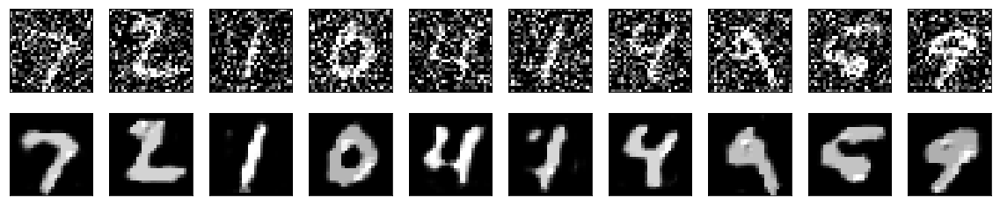

In [12]:
decoded_imgs = autoencoder.predict(x_test_noisy)
show_results(decoded_imgs, x_test_noisy)

In [13]:
autoencoder.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 32)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 32)          9248      
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 14, 14, 32)        0         
__________

In [17]:
from keras.utils import plot_model
plot_model(autoencoder, to_file='denoising_CNN_model.png')


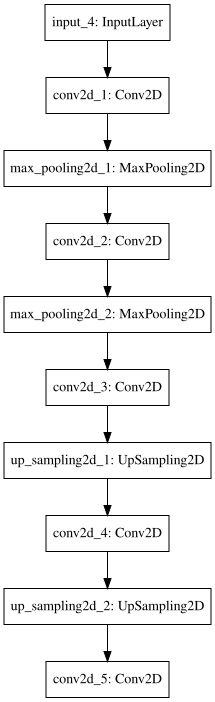

In [19]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

SVG(model_to_dot(autoencoder).create(prog='dot', format='svg'))